In [1]:
# install transformer moels
%pip install accelerate transformers bertopic top2vec[sentence_transformers]
%pip install -i https://pypi.org/simple/ bitsandbytes

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.7/143.7 kB 8.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 71.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.8/88.8 kB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 5.1 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple/
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 122.4/122.4 MB 7.6 MB/s eta 0:00:00


In [2]:
# import libraries
import warnings
import os
from torch import cuda
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import timeit
import platform
from pathlib import Path
from datetime import datetime

# Tokenization tools
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from string import punctuation
import re

# Scikit-Learn
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import CountVectorizer

# Coherence
import gensim.corpora as corpora
from gensim.models.coherencemodel import CoherenceModel
from gensim.utils import tokenize

# Word Clouds
from wordcloud import WordCloud

In [37]:
# class to calculate coherence score
class Metrics():

  def bert_coherence(self, sentences, topics):

    # Preprocess Documents
    documents = pd.DataFrame({
        "Document": sentences,
        "ID": range(len(sentences)),
        "Topic": topics}
    )
    documents_per_topic = documents.groupby(['Topic'], as_index=False).agg({'Document': ' '.join})
    cleaned_docs = BERTopic_model._preprocess_text(documents_per_topic.Document.values)

    # Extract vectorizer and analyzer from BERTopic
    vectorizer = BERTopic_model.vectorizer_model
    analyzer = vectorizer.build_analyzer()

    # Extract features for Topic Coherence evaluation
    words = vectorizer.get_feature_names_out()
    tokens = [analyzer(doc) for doc in cleaned_docs]
    dictionary = corpora.Dictionary(tokens)
    corpus = [dictionary.doc2bow(token) for token in tokens]
    topic_words = []
    for topic in set(topics):
        try:
            topic_data = BERTopic_model.get_topic(topic)
            if topic_data:  # Ensure the topic is valid
                topic_words.append([word for word, _ in topic_data])
        except Exception as e:
            print(f"Error processing topic {topic}: {e}")

    # Evaluate
    coherence_model = CoherenceModel(
        topics=topic_words,
        texts=tokens,
        corpus=corpus,
        dictionary=dictionary,
        coherence='c_v'
    )
    coherence = coherence_model.get_coherence()
    return coherence

  def t2v_coherence(self, sentences, topics):
      tokenized = [list(tokenize(doc)) for doc in sentences]
      id2word = corpora.Dictionary(tokenized)
      corpus = [id2word.doc2bow(text) for text in tokenized]

      # make sure you grab the topic words from the topic model and convert them to a list
      coherence_model = CoherenceModel(
          topics = topics,
          texts=tokenized,
          corpus=corpus,
          dictionary=id2word,
          coherence='c_v',
          topn=10
      )
      coherence = coherence_model.get_coherence()
      return coherence



In [4]:
# class to create wordclouds
class AllWordClouds():

    def lda_wordcloud(self, topic, lda_model):
        wordcloud = WordCloud(background_color="white", max_words=1000, contour_width=3, contour_color='steelblue')
        texts = [x[0] for x in lda_model.show_topic(topic)]
        long_string = ','.join(texts)
        wordcloud.generate(long_string)

        return wordcloud.to_image()


In [5]:
# read the dataset
data = pd.read_csv('boomlive_data_cleaned.csv', encoding='unicode_escape')
data.head()

,Category,Link,Heading,Sub_heading,Author,Date,Claim,Fact_check,Claim_summary,Claimed_by,Fact_check_summary,Links,Year,Month
0,fact check,https://www.boomlive.in/fact-check/awami-leagu...,bangladeshi actor being heckled on video false...,"according to local reports, mishti subas was c...",Archis Chowdhury,10/10/2024 14:16,video shows an american woman being heckled in...,boom identified the woman as bangladeshi actor...,video shows an american woman being heckled in...,social media users,FALSE,"['https://archive.is/607Xw', 'https://www.face...",2024,10
1,fast check,https://www.boomlive.in/fast-check/morphed-pho...,morphed photo falsely shared as patanjali sell...,boom found that the viral image was morphed fr...,Yangchula Bhutia,10/9/2024 13:33,an image showing a beef biryani spice mix with...,boom found that the viral image claiming patan...,a viral image claims that patanjali manufactur...,facebook,FALSE,NaN,2024,10
2,fact check,https://www.boomlive.in/fact-check/video-of-ma...,video of man killed by cousins in bangladesh f...,boom found that the deceased man's name is han...,Tausif Akbar,10/8/2024 18:36,video shows a hindu man killed by slitting his...,the incident happened because of personal enmi...,video shows body of a hindu man killed by slit...,"facebook users, x users",FALSE,[],2024,10
3,fact check,https://www.boomlive.in/fact-check/lebanon-tv-...,video from iraqi prank show peddled as lebanes...,boom found that the video is from an iraqi cha...,Nivedita Niranjankumar,10/8/2024 17:40,tv actress in lebanon slaps a maulvi for makin...,boom found that the video is from an iraqi cha...,lebanese tv actress slaps maulvi for insulting...,x and facebook users,FALSE,['https://youtu.be/fo-Dc6Hud5Q?si=knDtIUq-Vn4c...,2024,10
4,fact check,https://www.boomlive.in/fact-check/israel-pale...,viral claims of icj declaring israel an illega...,the icj ruling specifically pertains to israel...,Archis Chowdhury,10/8/2024 15:45,a video showing palestineâs foreign minister...,"the video is from july 2024, and shows the pal...",video shows palestinian foreign minister brief...,social media users,FALSE,['https://www.facebook.com/farjahan.shawon/vid...,2024,10


In [6]:
# first few claims
data['Claim'].head()

,Claim
0,video shows an american woman being heckled in...
1,an image showing a beef biryani spice mix with...
2,video shows a hindu man killed by slitting his...
3,tv actress in lebanon slaps a maulvi for makin...
4,a video showing palestineâs foreign minister...


In [7]:
# shape of the data
data.shape

(3133, 14)

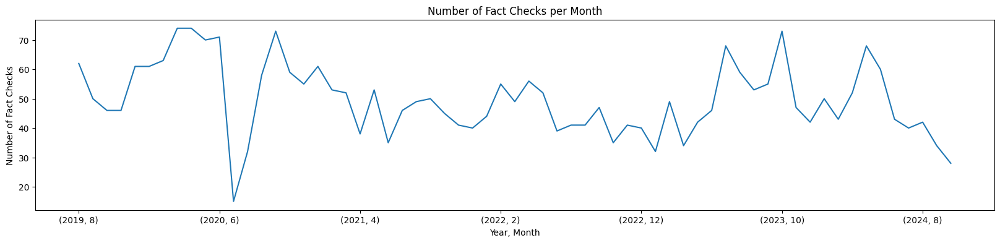

In [8]:
# plot the number of fact checks per month
plt.figure(figsize=(20, 4))
data.groupby(['Year', 'Month']).size().plot()
plt.title('Number of Fact Checks per Month')
plt.xlabel('Year, Month')
plt.ylabel('Number of Fact Checks')
plt.show()

<ipython-input-9-2228d33434d4>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Year', data=data, palette='coolwarm')


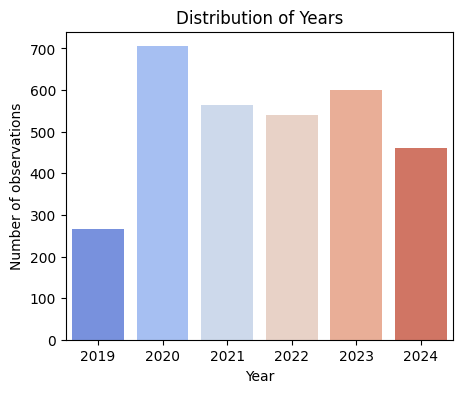

In [9]:
# histogram of the Year column using seaborn
plt.figure(figsize=(5, 4))
sns.countplot(x='Year', data=data, palette='coolwarm')
plt.title('Distribution of Years')
plt.xlabel('Year')
plt.ylabel('Number of observations')
plt.show()

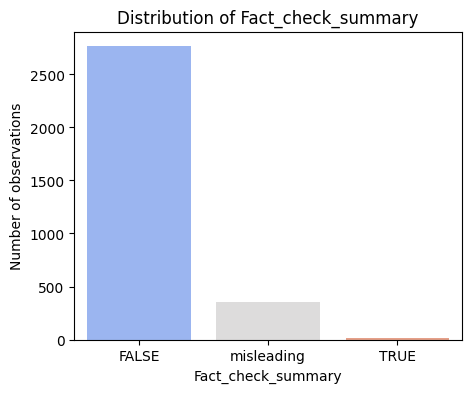

In [45]:
# histogram of the Fact_check_summary column using seaborn
plt.figure(figsize=(5, 4))
sns.countplot(x='Fact_check_summary', data=data, palette='coolwarm')
plt.title('Distribution of Fact_check_summary')
plt.xlabel('Fact_check_summary')
plt.ylabel('Number of observations')
plt.show()

In [10]:
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

### **Working on whole dataset**

In [11]:
# preprocess the text data
# remove stopwords
stop_words = set(stopwords.words('english'))

# extract the claims
claims = data['Claim']

# drop NaN values
claims = claims.dropna()


# Custom stopwords specific to misinformation data
custom_stopwords = {'claim', 'false', 'video', 'social', 'image', 'media', 'online', 'showing', 'shows', 'show', 'viral',
                    'share', 'shared'}
all_stopwords = stop_words.union(custom_stopwords)

# Sample data
claims = claims.apply(lambda x: " ".join([word for word in x.lower().split() if word not in all_stopwords]))

In [12]:
## lemmitization and stemming
from nltk.stem import WordNetLemmatizer
from nltk.stem import PorterStemmer
nltk.download('wordnet')
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')

# Lemmatization
lemmatizer = WordNetLemmatizer()
claims = claims.apply(lambda x: " ".join([lemmatizer.lemmatize(word) for word in x.split()]))
print(claims.head())

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.


0     american woman heckled bangladesh wearing hijab.
1    beef biryani spice mix patanjali branding circ...
2    hindu man killed slitting throat front everyon...
3    tv actress lebanon slap maulvi making abusive ...
4    palestineâs foreign minister addressing fals...
Name: Claim, dtype: object


In [15]:
# create a list of strings of claims
claims = claims.tolist()

### **Clustering Algorithms on Embedding Spaces**

### **Top2Vec**

Top2Vec (https://github.com/ddangelov/Top2Vec) is an algorithm that simultaneously learns the topic representations and the word embeddings. By mapping documents to a continuous vector space, Top2Vec identifies clusters of documents that share similar themes without requiring a pre-defined number of topics. This approach allows for the discovery of natural and meaningful topics directly from the data.

Top2Vec involves the following steps:

1.  **Embedding Creation:** Top2Vec uses word embeddings to create document vectors.
2.  **Dimensionality Reduction:** The document vectors are reduced to a lower-dimensional space using techniques like UMAP.
3.  **Clustering:** The reduced vectors are clustered to identify topics.
4.  **Topic Words Identification:** The algorithm finds words that are closest to the cluster centroids, representing the topics.





In [13]:
# import top2vec package
from top2vec import Top2Vec

In [17]:
# choose the embedding model
embeddings = 'distiluse-base-multilingual-cased'

# train the Top2Vec model
min_word_count = 5

t2v_model = Top2Vec(
    documents=claims,
    embedding_model=embeddings,
    min_count=min_word_count
)

2024-12-02 19:25:02,771 - top2vec - INFO - Pre-processing documents for training
INFO:top2vec:Pre-processing documents for training
/usr/local/lib/python3.10/dist-packages/sklearn/feature_extraction/text.py:521: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(
2024-12-02 19:25:03,643 - top2vec - INFO - Downloading distiluse-base-multilingual-cased model
INFO:top2vec:Downloading distiluse-base-multilingual-cased model
/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


modules.json:   0%|          | 0.00/341 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/2.39k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/607 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/539M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/528 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/996k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.96M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

2_Dense/config.json:   0%|          | 0.00/114 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.58M [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/1.58M [00:00<?, ?B/s]

rust_model.ot:   0%|          | 0.00/1.58M [00:00<?, ?B/s]

2024-12-02 19:25:14,564 - top2vec - INFO - Creating joint document/word embedding
INFO:top2vec:Creating joint document/word embedding
2024-12-02 19:25:20,313 - top2vec - INFO - Creating lower dimension embedding of documents
INFO:top2vec:Creating lower dimension embedding of documents
2024-12-02 19:25:44,492 - top2vec - INFO - Finding dense areas of documents
INFO:top2vec:Finding dense areas of documents
2024-12-02 19:25:44,575 - top2vec - INFO - Finding topics
INFO:top2vec:Finding topics


In [19]:
topics = t2v_model.get_topics()

words_list = topics[0]
scores_list = topics[1]
topic_num_list = topics[2]
topic_size_list, _ = t2v_model.get_topic_sizes()

print(f'Top2Vec extracted {t2v_model.get_num_topics()} topics.\n')

for words, scores, topic_num in zip(words_list, scores_list, topic_num_list):
    df_vis = pd.DataFrame({'word': words, 'score': scores})
    topic_size = topic_size_list[topic_num]
    print(f'Topic {topic_num} ({topic_size} Claims):')
    print(df_vis.head(10), '\n')

Top2Vec extracted 29 topics.

Topic 0 (255 Claims):
        word     score
0   hinduism  0.314483
1   islamist  0.303655
2   hindutva  0.301523
3      hindu  0.295058
4    islamic  0.290055
5      islam  0.287411
6    islamia  0.286850
7     muslim  0.284785
8  muslimeen  0.284778
9    muslims  0.280027 

Topic 1 (250 Claims):
            word     score
0       kejriwal  0.348243
1       minister  0.342266
2      jharkhand  0.268421
3          hindu  0.265993
4          nehru  0.264765
5         bharat  0.252543
6       hindutva  0.251911
7  parliamentary  0.251824
8     parliament  0.251369
9      hindustan  0.246518 

Topic 2 (184 Claims):
         word     score
0    minister  0.333234
1    kejriwal  0.294054
2    ministry  0.245253
3   jharkhand  0.234833
4       photo  0.224052
5    governor  0.216543
6      photos  0.210423
7       image  0.207732
8  photograph  0.207341
9       nehru  0.204538 

Topic 3 (184 Claims):
        word     score
0  policeman  0.419539
1     police  0.

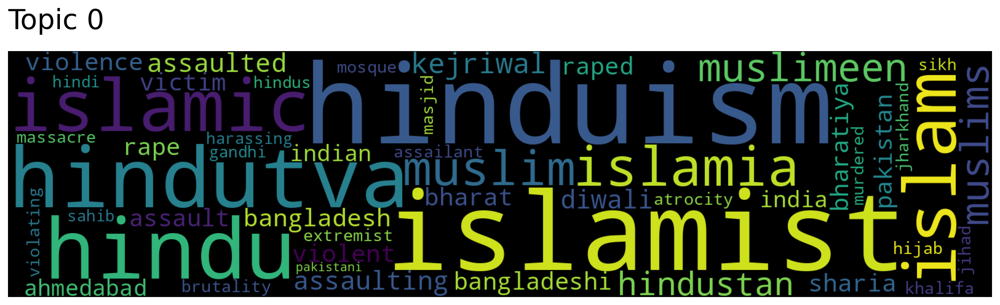

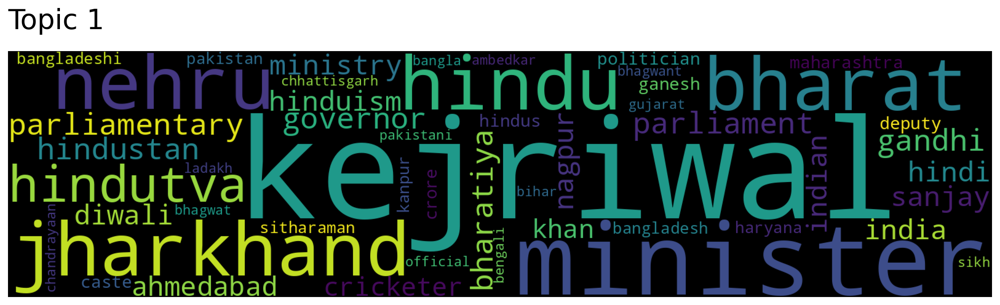

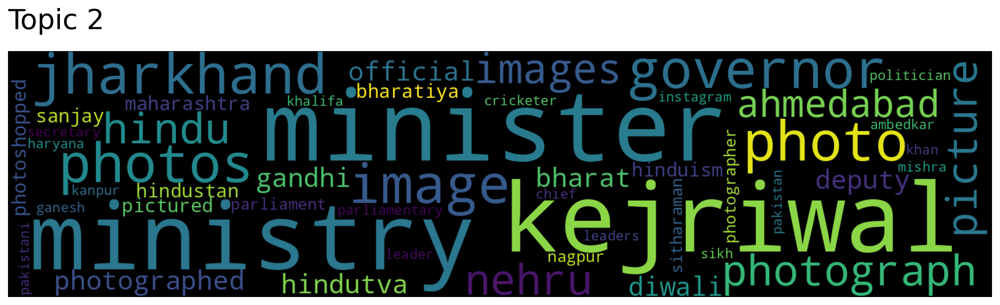

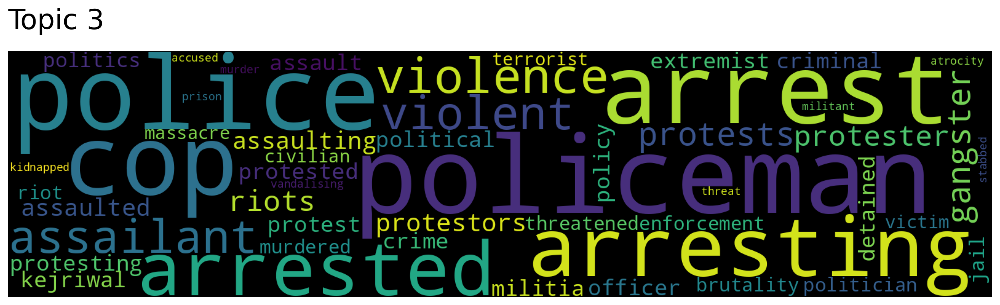

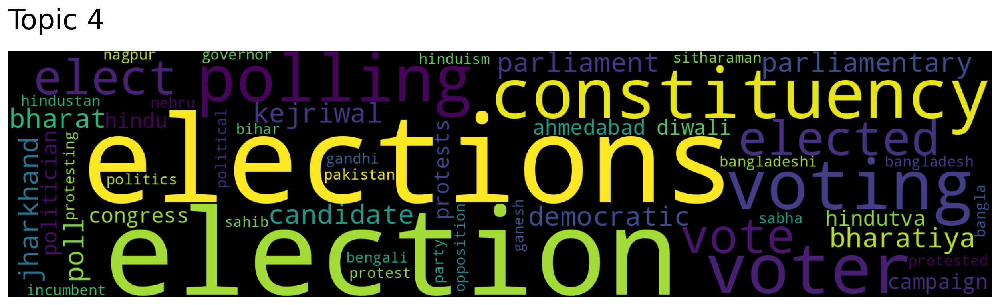

In [20]:
for topic in range(5):
    t2v_model.generate_topic_wordcloud(topic)


In [21]:
metrics = Metrics()
t2v_coherence = metrics.t2v_coherence(claims, t2v_model.get_topics()[0])

print("Top2Vec Model Coherence: ", round(t2v_coherence, 5))

Top2Vec Model Coherence:  0.41196


##**BERTopic**

BERTopic leverages transformer-based embeddings to create document representations and applies clustering algorithms to discover topics. It combines BERT embeddings with clustering techniques like HDBSCAN and dimensionality reduction methods like UMAP to generate coherent topics from text data.

BERTopic involves the following steps:

1.  **Embedding Creation:** BERTopic uses transformer models to create document embeddings.
2.  **Dimensionality Reduction:** The embeddings are reduced in dimensionality using UMAP.
3.  **Clustering:** Density-based clustering algorithm such as HDBSCAN are applied to form clusters from the reduced embeddings.
4.  **Topic Representation:** The algorithm generates topics based on the clustered documents and their embeddings. In this step, LLMs can be used for automatic and meaningful topic labeling.

In [22]:
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
from umap import UMAP
from hdbscan import HDBSCAN
from torch import bfloat16
import transformers
from bertopic.representation import KeyBERTInspired, MaximalMarginalRelevance, TextGeneration

In [24]:
# import the embedding_model
embeddings = SentenceTransformer("sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2")

# train the BERTopic model
min_topic_size = 30

BERTopic_model = BERTopic(
    embedding_model=embeddings,
    min_topic_size=min_topic_size,
    verbose=True
)
topics, probs = BERTopic_model.fit_transform(claims)

2024-12-02 19:35:11,574 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/92 [00:00<?, ?it/s]

2024-12-02 19:35:16,227 - BERTopic - Embedding - Completed ✓
2024-12-02 19:35:16,231 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-12-02 19:35:38,028 - BERTopic - Dimensionality - Completed ✓
2024-12-02 19:35:38,030 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-12-02 19:35:38,162 - BERTopic - Cluster - Completed ✓
2024-12-02 19:35:38,168 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-12-02 19:35:38,261 - BERTopic - Representation - Completed ✓


In [25]:
BERTopic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,1513,-1_minister_old_claiming_claim,"[minister, old, claiming, claim, india, party,...",[prime minister narendra modi saying people ch...
1,0,330,0_israel_israeli_hamas_conflict,"[israel, israeli, hamas, conflict, old, gaza, ...","[collage two old photos, one israeli flag pain..."
2,1,177,1_woman_man_hindu_muslim,"[woman, man, hindu, muslim, communal, beaten, ...",[disturbing woman beaten group armed men woman...
3,2,115,2_covid_19_coronavirus_vaccine,"[covid, 19, coronavirus, vaccine, hospital, pa...",[detail covid-19 facility set 2020 defence res...
4,3,105,3_photo_minister_modi_prime,"[photo, minister, modi, prime, narendra, gandh...",[morphed prime minister narendra modi's photo ...
5,4,89,4_rally_flag_slogan_pakistan,"[rally, flag, slogan, pakistan, procession, pr...",[old crowd holding green flag resurfaced pakis...
6,5,87,5_police_policeman_cop_officer,"[police, policeman, cop, officer, man, recent,...",[old police officer trampling person's face ca...
7,6,80,6_election_party_assembly_poll,"[election, party, assembly, poll, bjp, sabha, ...",[claiming graphic news minute (tnm) predicting...
8,7,71,7_farmers_farmer_protest_ongoing,"[farmers, farmer, protest, ongoing, sikh, delh...",[two-year-old gathering farmer long march nash...
9,8,69,8_twitter_tweet_account_fake,"[twitter, tweet, account, fake, impersonating,...",[several twitter user wednesday took dig delhi...


In [38]:
metrics = Metrics()
bert_coherence = metrics.bert_coherence(claims, topics)

print("BERTopic Model Metrics (Coherence): ", round(bert_coherence, 5))


BERTopic Model Metrics (Coherence):  0.65712


## **Lets work on 2024 data as we have some prior knowledge**

**Events happend in 2024:**
1.  2024 General Election in May-June
2.  Bangladesh's Political Unrest during August
3.  RG Kar Medical College Case

In [39]:
# get 2024 data
data_2024 = data[data['Year'] == 2024]
data_2024.head()

,Category,Link,Heading,Sub_heading,Author,Date,Claim,Fact_check,Claim_summary,Claimed_by,Fact_check_summary,Links,Year,Month
0,fact check,https://www.boomlive.in/fact-check/awami-leagu...,bangladeshi actor being heckled on video false...,"according to local reports, mishti subas was c...",Archis Chowdhury,10/10/2024 14:16,video shows an american woman being heckled in...,boom identified the woman as bangladeshi actor...,video shows an american woman being heckled in...,social media users,FALSE,"['https://archive.is/607Xw', 'https://www.face...",2024,10
1,fast check,https://www.boomlive.in/fast-check/morphed-pho...,morphed photo falsely shared as patanjali sell...,boom found that the viral image was morphed fr...,Yangchula Bhutia,10/9/2024 13:33,an image showing a beef biryani spice mix with...,boom found that the viral image claiming patan...,a viral image claims that patanjali manufactur...,facebook,FALSE,NaN,2024,10
2,fact check,https://www.boomlive.in/fact-check/video-of-ma...,video of man killed by cousins in bangladesh f...,boom found that the deceased man's name is han...,Tausif Akbar,10/8/2024 18:36,video shows a hindu man killed by slitting his...,the incident happened because of personal enmi...,video shows body of a hindu man killed by slit...,"facebook users, x users",FALSE,[],2024,10
3,fact check,https://www.boomlive.in/fact-check/lebanon-tv-...,video from iraqi prank show peddled as lebanes...,boom found that the video is from an iraqi cha...,Nivedita Niranjankumar,10/8/2024 17:40,tv actress in lebanon slaps a maulvi for makin...,boom found that the video is from an iraqi cha...,lebanese tv actress slaps maulvi for insulting...,x and facebook users,FALSE,['https://youtu.be/fo-Dc6Hud5Q?si=knDtIUq-Vn4c...,2024,10
4,fact check,https://www.boomlive.in/fact-check/israel-pale...,viral claims of icj declaring israel an illega...,the icj ruling specifically pertains to israel...,Archis Chowdhury,10/8/2024 15:45,a video showing palestineâs foreign minister...,"the video is from july 2024, and shows the pal...",video shows palestinian foreign minister brief...,social media users,FALSE,['https://www.facebook.com/farjahan.shawon/vid...,2024,10


In [41]:
data_2024.shape

(460, 14)

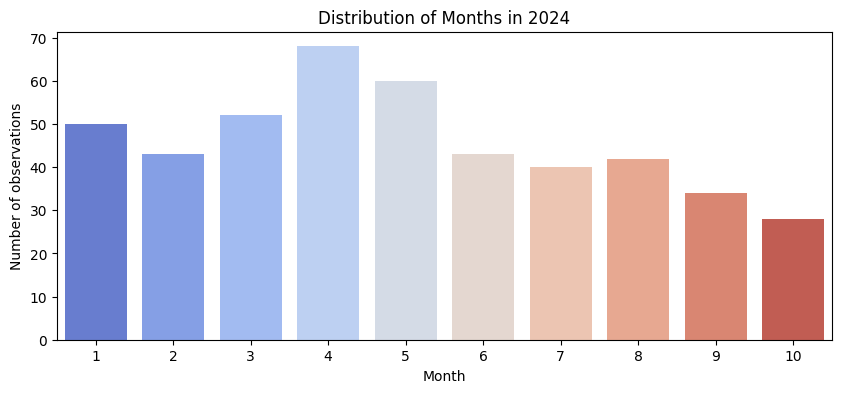

In [42]:
# histogram of the Month column using seaborn of year 2024
plt.figure(figsize=(10, 4))
sns.countplot(x='Month', data=data_2024, palette='coolwarm')
plt.title('Distribution of Months in 2024')
plt.xlabel('Month')
plt.ylabel('Number of observations')
plt.show()

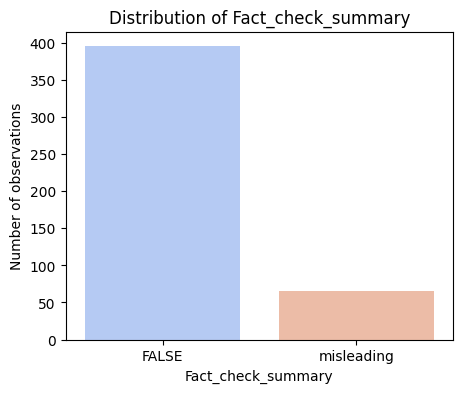

In [44]:
# distribution of fact-check summary
# histogram of the Fact_check_summary column using seaborn
plt.figure(figsize=(5, 4))
sns.countplot(x='Fact_check_summary', data=data_2024, palette='coolwarm')
plt.title('Distribution of Fact_check_summary')
plt.xlabel('Fact_check_summary')
plt.ylabel('Number of observations')
plt.show()

### **Categorize the data and evaluate befor, during and after the election**

**January - March** : Before election period  
**April - May** : Election period    
**June - September** : After election period  

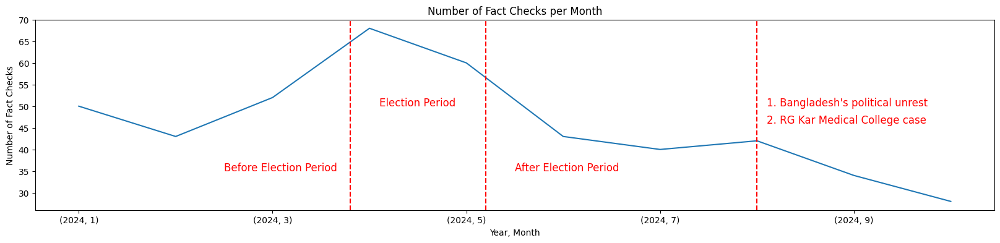

In [47]:
plt.figure(figsize=(20, 4))
data_2024.groupby(['Year', 'Month']).size().plot()
plt.title('Number of Fact Checks per Month')
plt.xlabel('Year, Month')
plt.ylabel('Number of Fact Checks')
plt.axvline(x=2.8, color='r', linestyle='--')
plt.axvline(x=4.2, color='r', linestyle='--')
plt.axvline(x=7, color='r', linestyle='--')
# add label to the election period in the plot inbetween the two red lines
plt.text(1.5, 35, 'Before Election Period', fontsize=12, color='r')
plt.text(3.1, 50, 'Election Period', fontsize=12, color='r')
plt.text(4.5, 35, 'After Election Period', fontsize=12, color='r')
plt.text(7.1, 50, "1. Bangladesh's political unrest", fontsize=12, color='r')
plt.text(7.1, 46, "2. RG Kar Medical College case", fontsize=12, color='r')
plt.show()

In [48]:
# get claims from 2024
claims_2024 = data_2024['Claim']

# drop NaN values
claims_2024 = claims_2024.dropna()

# remove stopwords
claims_2024 = claims_2024.apply(lambda x: " ".join([word for word in x.lower().split() if word not in all_stopwords]))

# lemmatization
claims_2024 = claims_2024.apply(lambda x: " ".join([lemmatizer.lemmatize(word) for word in x.split()]))

# create list
claims_2024 = claims_2024.tolist()

### **Top2Vec on 2024 data**

In [50]:
# choose the embedding model
embeddings = 'distiluse-base-multilingual-cased'

# train the Top2Vec model
min_word_count = 5

t2v_model_2024 = Top2Vec(
    documents=claims_2024,
    embedding_model=embeddings,
    min_count=min_word_count
)

2024-12-02 20:34:59,000 - top2vec - INFO - Pre-processing documents for training
INFO:top2vec:Pre-processing documents for training
2024-12-02 20:34:59,081 - top2vec - INFO - Downloading distiluse-base-multilingual-cased model
INFO:top2vec:Downloading distiluse-base-multilingual-cased model
2024-12-02 20:35:00,765 - top2vec - INFO - Creating joint document/word embedding
INFO:top2vec:Creating joint document/word embedding
2024-12-02 20:35:01,592 - top2vec - INFO - Creating lower dimension embedding of documents
INFO:top2vec:Creating lower dimension embedding of documents
2024-12-02 20:35:03,314 - top2vec - INFO - Finding dense areas of documents
INFO:top2vec:Finding dense areas of documents
2024-12-02 20:35:03,341 - top2vec - INFO - Finding topics
INFO:top2vec:Finding topics


In [51]:
topics_2024 = t2v_model_2024.get_topics()

words_list = topics_2024[0]
scores_list = topics_2024[1]
topic_num_list = topics_2024[2]
topic_size_list, _ = t2v_model_2024.get_topic_sizes()

print(f'Top2Vec extracted {t2v_model_2024.get_num_topics()} topics.\n')

for words, scores, topic_num in zip(words_list, scores_list, topic_num_list):
    df_vis = pd.DataFrame({'word': words, 'score': scores})
    topic_size = topic_size_list[topic_num]
    print(f'Topic {topic_num} ({topic_size} Claims):')
    print(df_vis.head(10), '\n')

Top2Vec extracted 4 topics.

Topic 0 (160 Claims):
         word     score
0       hindu  0.353508
1  bangladesh  0.322999
2    kejriwal  0.314470
3      muslim  0.299743
4   bharatiya  0.292894
5     islamic  0.290843
6    pakistan  0.267818
7      indian  0.261335
8       india  0.257473
9   assaulted  0.254825 

Topic 1 (153 Claims):
         word     score
0    kejriwal  0.366914
1       hindu  0.306848
2    minister  0.276579
3   bharatiya  0.270106
4      gandhi  0.262619
5      indian  0.245816
6       india  0.239397
7       hindi  0.237128
8  parliament  0.232075
9   cricketer  0.215074 

Topic 2 (78 Claims):
           word     score
0     elections  0.446631
1      election  0.439735
2  constituency  0.366877
3        voting  0.351216
4          vote  0.325640
5      kejriwal  0.293468
6    parliament  0.277893
7     candidate  0.272948
8          poll  0.265683
9     bharatiya  0.236696 

Topic 3 (61 Claims):
         word     score
0       hindu  0.384841
1      indian  0.

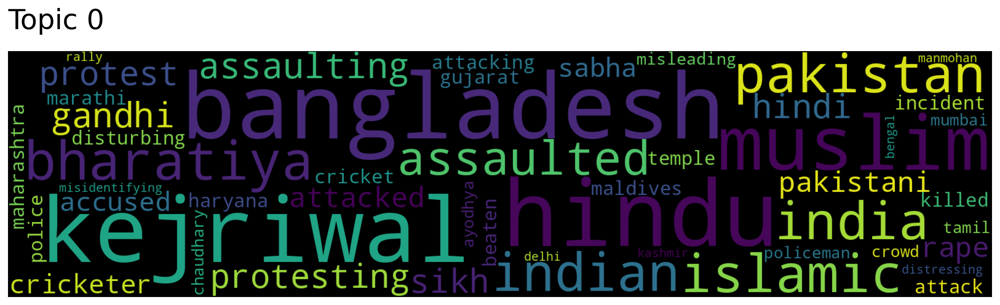

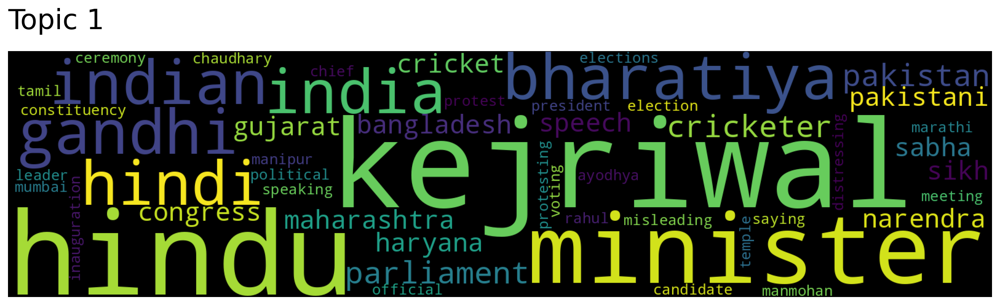

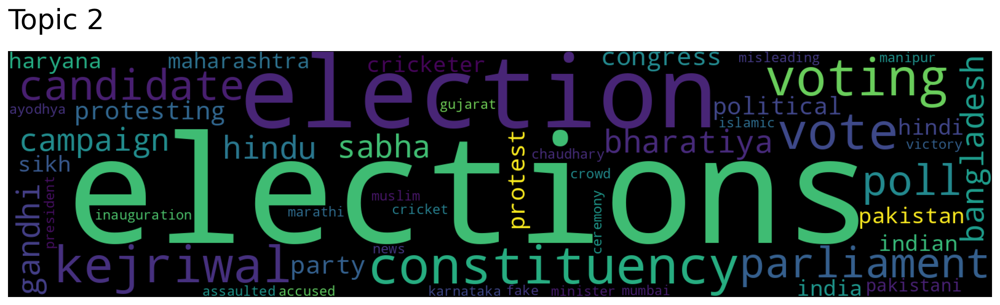

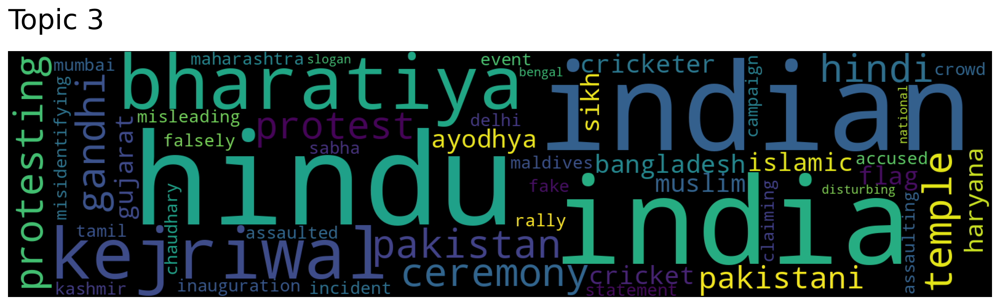

In [53]:
for topic in range(4):
    t2v_model_2024.generate_topic_wordcloud(topic)

In [54]:
metrics = Metrics()
t2v_coherence_2024 = metrics.t2v_coherence(claims_2024, t2v_model_2024.get_topics()[0])

print("Top2Vec Model Coherence: ", round(t2v_coherence_2024, 5))

Top2Vec Model Coherence:  0.35743


### **BERTopic on 2024 Data**

In [55]:
# import the embedding_model
embeddings = SentenceTransformer("sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2")

# train the BERTopic model
min_topic_size = 30

BERTopic_model = BERTopic(
    embedding_model=embeddings,
    min_topic_size=min_topic_size,
    verbose=True
)
topics_2024, probs_2024 = BERTopic_model.fit_transform(claims_2024)

2024-12-02 20:41:42,137 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/15 [00:00<?, ?it/s]

2024-12-02 20:41:42,716 - BERTopic - Embedding - Completed ✓
2024-12-02 20:41:42,718 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-12-02 20:41:44,347 - BERTopic - Dimensionality - Completed ✓
2024-12-02 20:41:44,349 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-12-02 20:41:44,376 - BERTopic - Cluster - Completed ✓
2024-12-02 20:41:44,381 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-12-02 20:41:44,433 - BERTopic - Representation - Completed ✓


In [56]:
BERTopic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,237,-1_old_muslim_man_hindu,"[old, muslim, man, hindu, minister, claiming, ...",[old hate speech muslim cleric bangladesh pedd...
1,0,161,0_party_minister_modi_congress,"[party, minister, modi, congress, prime, sabha...",[cropped kerala chief minister pinarayi vijaya...
2,1,54,1_woman_muslim_hindu_communal,"[woman, muslim, hindu, communal, group, bangla...",[west bengal's barasat district woman attacked...


In [57]:
metrics = Metrics()
bert_coherence_2024 = metrics.bert_coherence(claims_2024, topics_2024)

print("BERTopic Model Metrics (Coherence): ", round(bert_coherence_2024, 5))


BERTopic Model Metrics (Coherence):  0.55295


In [60]:
BERTopic_model.visualize_barchart()

**Model training (fixed K)**  
We can force BERTopic to extract K Topics by setting an external Clustering Model.

In [64]:
cluster_model = KMeans(n_clusters=5)

umap = UMAP(
    n_neighbors=15,
    n_components=5,
    min_dist=0.0,
    metric='cosine',
    low_memory=False,
    random_state=42
)

BERTopic_model = BERTopic(
    embedding_model=embeddings,
    umap_model=umap,
    min_topic_size=30,
    hdbscan_model=cluster_model,
    verbose=True
)
topics, probs = BERTopic_model.fit_transform(claims_2024)

2024-12-02 21:41:36,552 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/15 [00:00<?, ?it/s]

2024-12-02 21:41:37,225 - BERTopic - Embedding - Completed ✓
2024-12-02 21:41:37,226 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-12-02 21:41:40,488 - BERTopic - Dimensionality - Completed ✓
2024-12-02 21:41:40,495 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-12-02 21:41:40,594 - BERTopic - Cluster - Completed ✓
2024-12-02 21:41:40,600 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-12-02 21:41:40,646 - BERTopic - Representation - Completed ✓


In [65]:
BERTopic_model.get_topic_info()


,Topic,Count,Name,Representation,Representative_Docs
0,0,113,0_party_election_lok_sabha,"[party, election, lok, sabha, janata, bjp, bha...",[cropped kerala chief minister pinarayi vijaya...
1,1,107,1_minister_modi_prime_narendra,"[minister, modi, prime, narendra, india, congr...",[fake quote praising prime minister narendra m...
2,2,87,2_woman_hindu_muslim_communal,"[woman, hindu, muslim, communal, bangladesh, m...","[hindu woman assaulted bangladesh., disturbing..."
3,3,77,3_police_old_protest_delhi,"[police, old, protest, delhi, ongoing, man, fa...",[old group nihang sikh wielding sword attackin...
4,4,68,4_ram_temple_ayodhya_photo,"[ram, temple, ayodhya, photo, former, footage,...",[makeshift toilet setup swarved mahamandir var...


In [66]:
metrics = Metrics()
bert_coherence_2024_fixed_k = metrics.bert_coherence(claims_2024, topics)

print("BERTopic Model Metrics (Coherence): ", round(bert_coherence_2024_fixed_k, 5))

BERTopic Model Metrics (Coherence):  0.61508


In [67]:
BERTopic_model.visualize_barchart()

### **Partinoing the Data**
**January - March** : Before election period  
**April - May** : Election period    
**June - September** : After election period  

In [68]:
# categorize the data into before, during and after election period
data_before = data_2024[data_2024['Month'] <= 3]
print(data_before.shape)
data_during = data_2024[(data_2024['Month'] > 3) & (data_2024['Month'] <= 5)]
print(data_during.shape)
data_after = data_2024[data_2024['Month'] > 5]
print(data_after.shape)

(145, 14)
(128, 14)
(187, 14)


In [69]:
# aggregate the claims for each period
claims_before = data_before['Claim']
claims_during = data_during['Claim']
claims_after = data_after['Claim']

# drop NaN values
claims_before = claims_before.dropna()
claims_during = claims_during.dropna()
claims_after = claims_after.dropna()

# print the shape of the data
print("Befor:", claims_before.shape)
print("During:", claims_during.shape)
print("After:", claims_after.shape)

Befor: (143,)
During: (124,)
After: (185,)


In [70]:
# preprocess the text data
# remove stopwords
claims_before = claims_before.apply(lambda x: " ".join([word for word in x.lower().split() if word not in all_stopwords]))
claims_during = claims_during.apply(lambda x: " ".join([word for word in x.lower().split() if word not in all_stopwords]))
claims_after = claims_after.apply(lambda x: " ".join([word for word in x.lower().split() if word not in all_stopwords]))

# Lemmatization
claims_before = claims_before.apply(lambda x: " ".join([lemmatizer.lemmatize(word) for word in x.split()]))
claims_during = claims_during.apply(lambda x: " ".join([lemmatizer.lemmatize(word) for word in x.split()]))
claims_after = claims_after.apply(lambda x: " ".join([lemmatizer.lemmatize(word) for word in x.split()]))

### **BERTopic Implementation**

### **Before Election**

In [90]:
cluster_model = KMeans(n_clusters=4)

BERTopic_model = BERTopic(
    embedding_model=embeddings,
    umap_model=umap,
    min_topic_size=30,
    hdbscan_model=cluster_model,
    verbose=True
)

In [91]:
topics_before, probs_before = BERTopic_model.fit_transform(claims_before)

2024-12-02 22:15:50,421 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/5 [00:00<?, ?it/s]

2024-12-02 22:15:50,714 - BERTopic - Embedding - Completed ✓
2024-12-02 22:15:50,718 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-12-02 22:15:51,176 - BERTopic - Dimensionality - Completed ✓
2024-12-02 22:15:51,179 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-12-02 22:15:51,188 - BERTopic - Cluster - Completed ✓
2024-12-02 22:15:51,195 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-12-02 22:15:51,218 - BERTopic - Representation - Completed ✓


In [92]:
BERTopic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,0,53,0_minister_party_india_claiming,"[minister, party, india, claiming, modi, congr...",[fake quote attributed delhi chief minister ar...
1,1,37,1_muslim_woman_old_group,"[muslim, woman, old, group, communal, hindu, m...",[distressing man brutally thrashed paddle lyin...
2,2,35,2_ram_ayodhya_temple_misleading,"[ram, ayodhya, temple, misleading, indian, con...",[makeshift toilet setup swarved mahamandir var...
3,3,18,3_protest_ongoing_farmers_delhi,"[protest, ongoing, farmers, delhi, farmer, man...",[old man military uniform making controversial...


In [93]:
bert_coherence_before = metrics.bert_coherence(claims_before, topics_before)

print("BERTopic Model Metrics (Coherence): ", round(bert_coherence_before, 5))

BERTopic Model Metrics (Coherence):  0.66329


In [94]:
BERTopic_model.visualize_barchart()

### **During Election**

In [95]:
topics_during, probs_during = BERTopic_model.fit_transform(claims_during)

2024-12-02 22:16:20,004 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/4 [00:00<?, ?it/s]

2024-12-02 22:16:20,234 - BERTopic - Embedding - Completed ✓
2024-12-02 22:16:20,236 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-12-02 22:16:20,480 - BERTopic - Dimensionality - Completed ✓
2024-12-02 22:16:20,482 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-12-02 22:16:20,488 - BERTopic - Cluster - Completed ✓
2024-12-02 22:16:20,492 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-12-02 22:16:20,507 - BERTopic - Representation - Completed ✓


In [96]:
BERTopic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,0,35,0_minister_modi_prime_narendra,"[minister, modi, prime, narendra, congress, sa...",[purportedly congress leader rahul gandhi pred...
1,1,34,1_woman_old_rally_muslim,"[woman, old, rally, muslim, communal, resurfac...",[photograph featuring actor kangana ranaut rev...
2,2,33,2_party_lok_sabha_old,"[party, lok, sabha, old, elections, janata, bh...",[old group people recording accusing indian ar...
3,3,22,3_fake_party_bjp_claiming,"[fake, party, bjp, claiming, election, generat...",[purporting news anchor sudhir chaudhary predi...


In [97]:
bert_coherence_during = metrics.bert_coherence(claims_during, topics_during)

print("BERTopic Model Metrics (Coherence): ", round(bert_coherence_during, 5))

BERTopic Model Metrics (Coherence):  0.58742


In [98]:
BERTopic_model.visualize_barchart()

### **After Election**

In [111]:
cluster_model = KMeans(n_clusters=3)

BERTopic_model = BERTopic(
    embedding_model=embeddings,
    umap_model=umap,
    min_topic_size=30,
    hdbscan_model=cluster_model,
    verbose=True
)

topics_after, probs_after = BERTopic_model.fit_transform(claims_after)

2024-12-02 22:21:30,297 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/6 [00:00<?, ?it/s]

2024-12-02 22:21:30,862 - BERTopic - Embedding - Completed ✓
2024-12-02 22:21:30,869 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-12-02 22:21:31,635 - BERTopic - Dimensionality - Completed ✓
2024-12-02 22:21:31,638 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-12-02 22:21:31,644 - BERTopic - Cluster - Completed ✓
2024-12-02 22:21:31,649 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-12-02 22:21:31,665 - BERTopic - Representation - Completed ✓


In [112]:
BERTopic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,0,73,0_gandhi_minister_leader_prime,"[gandhi, minister, leader, prime, sabha, congr...",[screenshot bharatiya janata party's website l...
1,1,58,1_muslim_bangladesh_hindu_communal,"[muslim, bangladesh, hindu, communal, indian, ...","[group men attempting demolish dargah guntur, ..."
2,2,54,2_woman_hindu_bangladesh_medical,"[woman, hindu, bangladesh, medical, college, c...",[west bengal's barasat district woman attacked...


In [113]:
bert_coherence_during = metrics.bert_coherence(claims_during, topics_during)

print("BERTopic Model Metrics (Coherence): ", round(bert_coherence_during, 5))

BERTopic Model Metrics (Coherence):  0.49826


In [114]:
BERTopic_model.visualize_barchart()

### **Top2Vec Implementation**

### **Before Election**

In [116]:
# choose the embedding model
embeddings = 'distiluse-base-multilingual-cased'

# train the Top2Vec model
min_word_count = 5

claims_before = claims_before.tolist()

t2v_model_before = Top2Vec(
    documents=claims_before,
    embedding_model=embeddings,
    min_count=min_word_count
)

2024-12-02 22:36:26,573 - top2vec - INFO - Pre-processing documents for training
INFO:top2vec:Pre-processing documents for training
2024-12-02 22:36:26,592 - top2vec - INFO - Downloading distiluse-base-multilingual-cased model
INFO:top2vec:Downloading distiluse-base-multilingual-cased model
2024-12-02 22:36:27,931 - top2vec - INFO - Creating joint document/word embedding
INFO:top2vec:Creating joint document/word embedding
2024-12-02 22:36:28,274 - top2vec - INFO - Creating lower dimension embedding of documents
INFO:top2vec:Creating lower dimension embedding of documents
2024-12-02 22:36:28,528 - top2vec - INFO - Finding dense areas of documents
INFO:top2vec:Finding dense areas of documents
2024-12-02 22:36:28,536 - top2vec - INFO - Finding topics
INFO:top2vec:Finding topics


In [117]:
topics_before = t2v_model_before.get_topics()

words_list = topics_before[0]
scores_list = topics_before[1]
topic_num_list = topics_before[2]
topic_size_list, _ = t2v_model_before.get_topic_sizes()

print(f'Top2Vec extracted {t2v_model_before.get_num_topics()} topics.\n')

for words, scores, topic_num in zip(words_list, scores_list, topic_num_list):
    df_vis = pd.DataFrame({'word': words, 'score': scores})
    topic_size = topic_size_list[topic_num]
    print(f'Topic {topic_num} ({topic_size} Claims):')
    print(df_vis.head(10), '\n')

Top2Vec extracted 2 topics.

Topic 0 (91 Claims):
         word     score
0       hindu  0.398076
1      indian  0.339904
2       india  0.327454
3      gandhi  0.295969
4    pakistan  0.254590
5   cricketer  0.216957
6      temple  0.180180
7  misleading  0.153651
8    ceremony  0.152818
9     ayodhya  0.143387 

Topic 1 (52 Claims):
        word     score
0    protest  0.270848
1      hindu  0.236832
2     police  0.233431
3  policeman  0.226000
4     muslim  0.213994
5   pakistan  0.166821
6     indian  0.166798
7      india  0.156539
8     gandhi  0.151263
9    accused  0.148573 



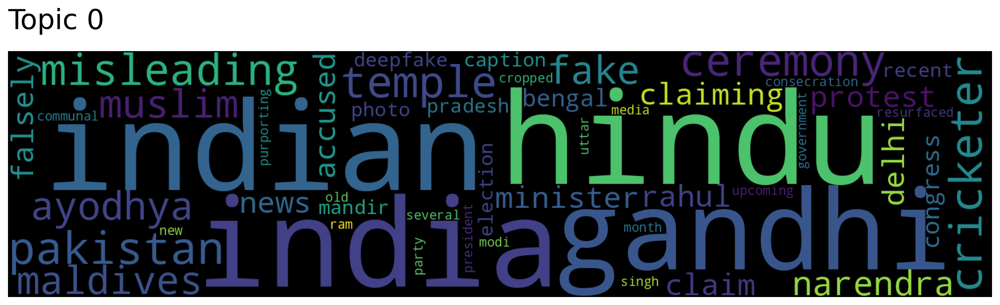

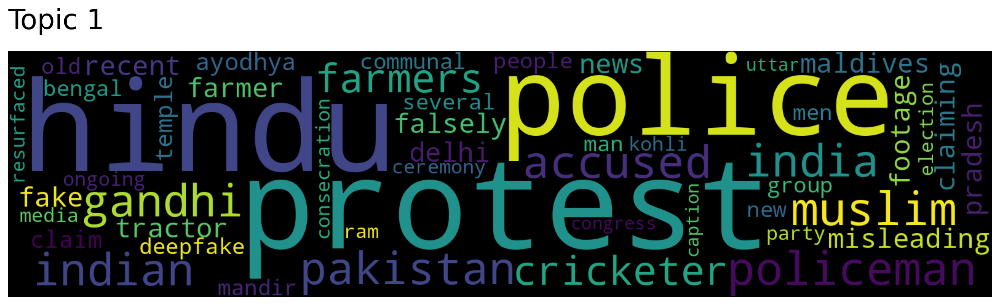

In [118]:
for topic in range(2):
    t2v_model_before.generate_topic_wordcloud(topic)

In [120]:
t2v_coherence_before = metrics.t2v_coherence(claims_before, t2v_model_before.get_topics()[0])

print("Top2Vec Model Coherence: ", round(t2v_coherence_before, 5))

Top2Vec Model Coherence:  0.33444


### **During Election**

In [ ]:
claims_during = claims_during.tolist()

In [123]:
t2v_model_during = Top2Vec(
    documents=claims_during,
    embedding_model=embeddings,
    min_count=min_word_count
)

2024-12-02 22:43:24,583 - top2vec - INFO - Pre-processing documents for training
INFO:top2vec:Pre-processing documents for training
2024-12-02 22:43:24,609 - top2vec - INFO - Downloading distiluse-base-multilingual-cased model
INFO:top2vec:Downloading distiluse-base-multilingual-cased model
2024-12-02 22:43:25,924 - top2vec - INFO - Creating joint document/word embedding
INFO:top2vec:Creating joint document/word embedding
2024-12-02 22:43:26,247 - top2vec - INFO - Creating lower dimension embedding of documents
INFO:top2vec:Creating lower dimension embedding of documents
2024-12-02 22:43:26,522 - top2vec - INFO - Finding dense areas of documents
INFO:top2vec:Finding dense areas of documents
2024-12-02 22:43:26,535 - top2vec - INFO - Finding topics
INFO:top2vec:Finding topics


In [124]:
topics_during = t2v_model_during.get_topics()

words_list = topics_during[0]
scores_list = topics_during[1]
topic_num_list = topics_during[2]
topic_size_list, _ = t2v_model_during.get_topic_sizes()

print(f'Top2Vec extracted {t2v_model_during.get_num_topics()} topics.\n')

for words, scores, topic_num in zip(words_list, scores_list, topic_num_list):
    df_vis = pd.DataFrame({'word': words, 'score': scores})
    topic_size = topic_size_list[topic_num]
    print(f'Topic {topic_num} ({topic_size} Claims):')
    print(df_vis.head(10), '\n')

Top2Vec extracted 2 topics.

Topic 0 (69 Claims):
        word     score
0  elections  0.352053
1   election  0.346629
2   kejriwal  0.345058
3     voting  0.286716
4  bharatiya  0.282044
5      hindu  0.267337
6       vote  0.265341
7     gandhi  0.234226
8   pakistan  0.231119
9  candidate  0.224938 

Topic 1 (55 Claims):
        word     score
0   kejriwal  0.330872
1   minister  0.277085
2      hindu  0.265526
3  bharatiya  0.245107
4     gandhi  0.224231
5     indian  0.211222
6      india  0.200660
7   pakistan  0.183594
8     speech  0.158258
9   congress  0.157636 



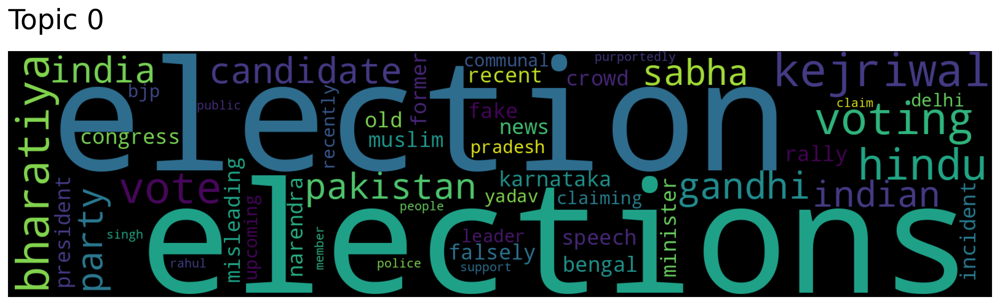

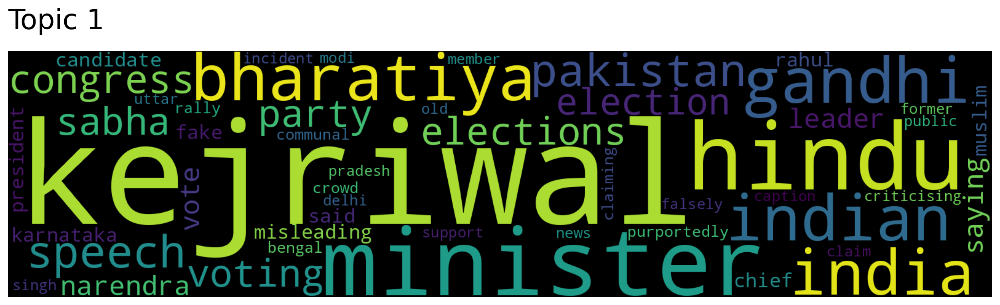

In [125]:
for topic in range(2):
    t2v_model_during.generate_topic_wordcloud(topic)

In [126]:
t2v_coherence_during = metrics.t2v_coherence(claims_during, t2v_model_during.get_topics()[0])

print("Top2Vec Model Coherence: ", round(t2v_coherence_during, 5))

Top2Vec Model Coherence:  0.3273


### **After Election**

In [ ]:
claims_after = claims_after.tolist()

In [128]:
t2v_model_after = Top2Vec(
    documents=claims_after,
    embedding_model=embeddings,
    min_count=min_word_count
)

2024-12-02 23:00:02,994 - top2vec - INFO - Pre-processing documents for training
INFO:top2vec:Pre-processing documents for training
2024-12-02 23:00:03,027 - top2vec - INFO - Downloading distiluse-base-multilingual-cased model
INFO:top2vec:Downloading distiluse-base-multilingual-cased model
2024-12-02 23:00:04,592 - top2vec - INFO - Creating joint document/word embedding
INFO:top2vec:Creating joint document/word embedding
2024-12-02 23:00:04,955 - top2vec - INFO - Creating lower dimension embedding of documents
INFO:top2vec:Creating lower dimension embedding of documents
2024-12-02 23:00:05,306 - top2vec - INFO - Finding dense areas of documents
INFO:top2vec:Finding dense areas of documents
2024-12-02 23:00:05,315 - top2vec - INFO - Finding topics
INFO:top2vec:Finding topics


In [129]:
topics_after = t2v_model_after.get_topics()

words_list = topics_after[0]
scores_list = topics_after[1]
topic_num_list = topics_after[2]
topic_size_list, _ = t2v_model_after.get_topic_sizes()

print(f'Top2Vec extracted {t2v_model_after.get_num_topics()} topics.\n')

for words, scores, topic_num in zip(words_list, scores_list, topic_num_list):
    df_vis = pd.DataFrame({'word': words, 'score': scores})
    topic_size = topic_size_list[topic_num]
    print(f'Topic {topic_num} ({topic_size} Claims):')
    print(df_vis.head(10), '\n')

Top2Vec extracted 2 topics.

Topic 0 (108 Claims):
         word     score
0       hindu  0.398884
1  bangladesh  0.380599
2   bharatiya  0.335790
3      muslim  0.320102
4     islamic  0.312593
5      indian  0.296899
6       india  0.294845
7      gandhi  0.276319
8   assaulted  0.235331
9       sabha  0.205507 

Topic 1 (77 Claims):
         word     score
0       hindu  0.274116
1      gandhi  0.257233
2   bharatiya  0.256105
3    minister  0.222392
4      indian  0.216789
5       india  0.213560
6  bangladesh  0.207106
7    election  0.204431
8   elections  0.199549
9    congress  0.190339 



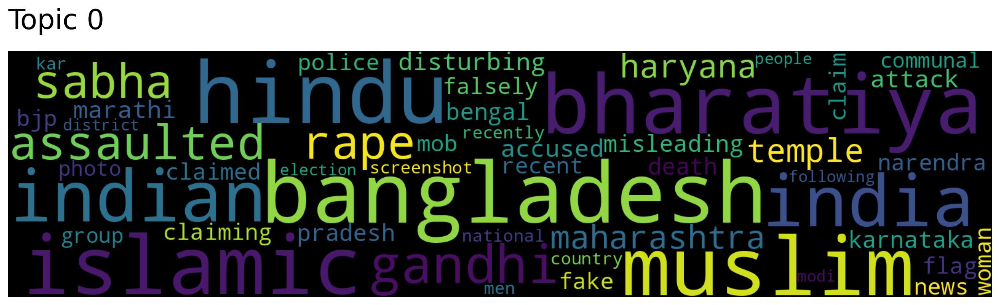

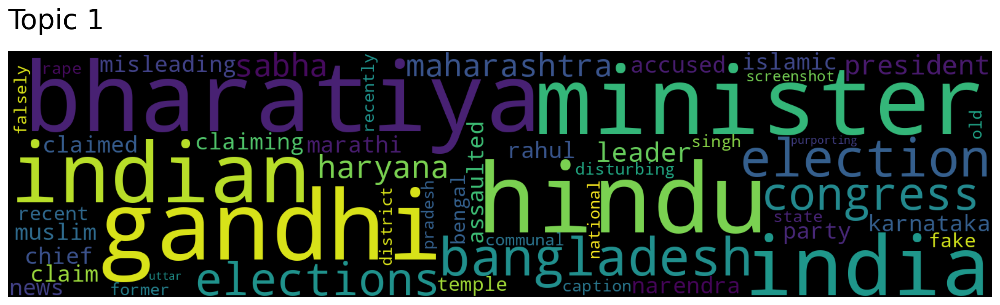

In [130]:
for topic in range(2):
    t2v_model_after.generate_topic_wordcloud(topic)

In [131]:
t2v_coherence_after = metrics.t2v_coherence(claims_after, t2v_model_after.get_topics()[0])

print("Top2Vec Model Coherence: ", round(t2v_coherence_after, 5))

Top2Vec Model Coherence:  0.29271
